---
title: London Centralities
date-format: long
date-modified: last-modified
lang: en
language:
  title-block-modified: "Last update"
---


Install and update `cityseer` if necessary.


In [1]:
# !pip install --upgrade cityseer

## Data Source

The following example uses the [OS Open Roads](https://osdatahub.os.uk/downloads/open/OpenRoads) dataset, which is available under the [Open Government License](http://os.uk/opendata/licence).


## Preparation

The following example assumes that the OS Open Roads dataset has been downloaded to `temp/os_open_roads/oproad_gb.gpkg` relative to the root of the `cityseer-examples` repository. Please edit the paths and path setup in this cell if you are using different directories.


In [2]:
from pathlib import Path

repo_path = Path.cwd()
if str(repo_path).endswith("/examples"):
    repo_path = Path.cwd() / ".."
if not str(repo_path.resolve()).endswith("cityseer-examples"):
    raise ValueError(
        "Please check your notebook working directory relative to your project and data paths."
    )

open_roads_path = Path(repo_path / "temp/os_open_roads/oproad_gb.gpkg")
print("data path:", open_roads_path)
print("path exists:", open_roads_path.exists())

data path: /Users/gareth/dev/benchmark-urbanism/cityseer-examples/temp/os_open_roads/oproad_gb.gpkg
path exists: True


## Extents

Instead of loading the entire dataset, we'll use a bounding box to only load an area of interest.


In [3]:
from pyproj import Transformer
from shapely import geometry

from cityseer.tools import graphs, io

# bbox setup
lng, lat = -0.13396079424572427, 51.51371088849723
buffer_dist = 5000
distances = [250, 500, 1000, 2000]
plot_buffer = 1500
# transform from WGS to BNG
transformer = Transformer.from_crs("EPSG:4326", "EPSG:27700")
easting, northing = transformer.transform(lat, lng)
# calculate bbox relative to centroid
centroid = geometry.Point(easting, northing)
target_bbox: tuple[float, float, float, float] = centroid.buffer(buffer_dist).bounds  # type: ignore
plot_bbox: tuple[float, float, float, float] = centroid.buffer(plot_buffer).bounds  # type: ignore

## Load

We can now load the OS Open Roads dataset and convert it to a format that can be used by cityseer for downstream calculations.


In [4]:
# load OS Open Roads data from downloaded geopackage
G_open = io.nx_from_open_roads(open_roads_path, target_bbox=target_bbox)
# decompose for higher resolution analysis
G_decomp = graphs.nx_decompose(G_open, 25)
# prepare the data structures
nodes_gdf, _edges_gdf, network_structure = io.network_structure_from_nx(
    G_decomp, crs=27700
)

INFO:cityseer.tools.io:Nodes: 18182
INFO:cityseer.tools.io:Edges: 24189
INFO:cityseer.tools.io:Dropped 430 edges where not both start and end nodes were present.
INFO:cityseer.tools.io:Running basic graph cleaning
INFO:cityseer.tools.graphs:Removing filler nodes.
100%|██████████| 18182/18182 [00:00<00:00, 101002.24it/s]
INFO:cityseer.tools.graphs:Merging parallel edges within buffer of 10.
100%|██████████| 22567/22567 [00:00<00:00, 259534.08it/s]
INFO:cityseer.tools.graphs:Decomposing graph to maximum edge lengths of 25.
100%|██████████| 22504/22504 [00:04<00:00, 4561.16it/s]
INFO:cityseer.tools.io:Preparing node and edge arrays from networkX graph.
100%|██████████| 75807/75807 [00:04<00:00, 15326.89it/s]


## Calculate centralities

The centrality methods can now be computed.


In [8]:
from cityseer.metrics import networks

# if you want to compute wider area centralities, e.g. 20km, then use less decomposition to speed up the computation
nodes_gdf = networks.node_centrality_shortest(
    network_structure=network_structure,
    nodes_gdf=nodes_gdf,
    distances=distances,
)
nodes_gdf_jitter = nodes_gdf.copy(deep=True)
nodes_gdf_jitter = networks.node_centrality_shortest(
    network_structure=network_structure,
    nodes_gdf=nodes_gdf_jitter,
    distances=distances,
    jitter_scale=1,
)
nodes_gdf = networks.node_centrality_simplest(
    network_structure=network_structure,
    nodes_gdf=nodes_gdf,
    distances=distances,
)

INFO:cityseer.metrics.networks:Computing shortest path node centrality.
100%|██████████| 75807/75807 [01:12<00:00, 1049.11it/s]
INFO:cityseer.config:Metrics computed for:
INFO:cityseer.config:Distance: 250m, Beta: 0.016, Walking Time: 3.130000114440918 minutes.
INFO:cityseer.config:Distance: 500m, Beta: 0.008, Walking Time: 6.25 minutes.
INFO:cityseer.config:Distance: 1000m, Beta: 0.004, Walking Time: 12.5 minutes.
INFO:cityseer.config:Distance: 2000m, Beta: 0.002, Walking Time: 25.0 minutes.
INFO:cityseer.metrics.networks:Computing shortest path node centrality.
100%|██████████| 75807/75807 [00:21<00:00, 3561.46it/s]
INFO:cityseer.config:Metrics computed for:
INFO:cityseer.config:Distance: 250m, Beta: 0.016, Walking Time: 3.130000114440918 minutes.
INFO:cityseer.config:Distance: 500m, Beta: 0.008, Walking Time: 6.25 minutes.
INFO:cityseer.config:Distance: 1000m, Beta: 0.004, Walking Time: 12.5 minutes.
INFO:cityseer.config:Distance: 2000m, Beta: 0.002, Walking Time: 25.0 minutes.
INFO

## Plots

Let's plot a selection of distance thresholds for each of the computed measures.


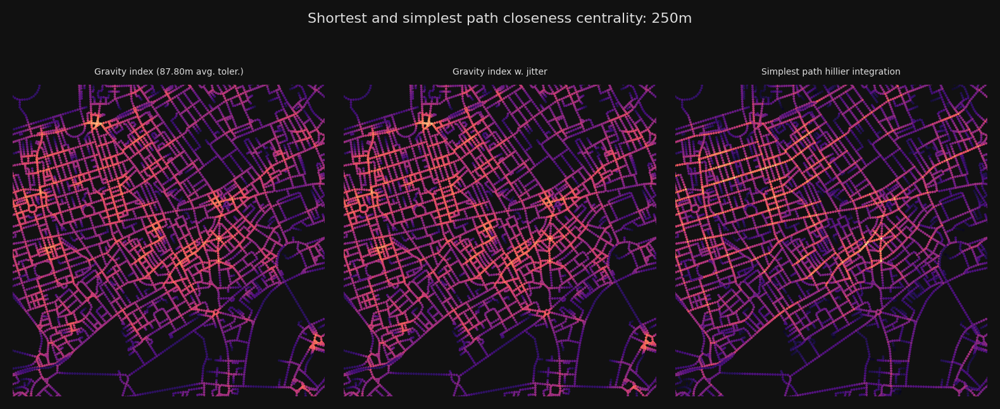

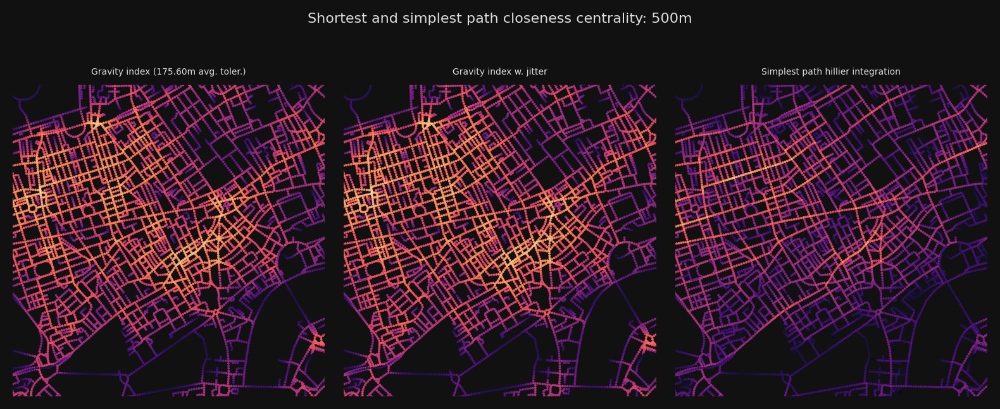

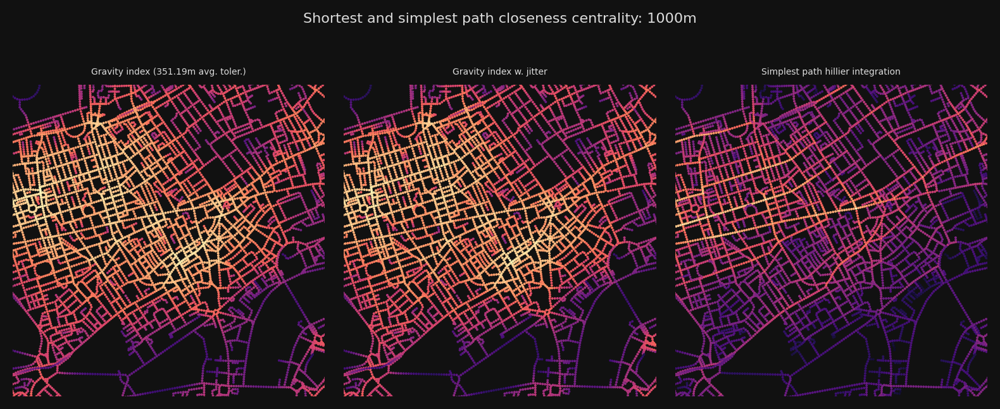

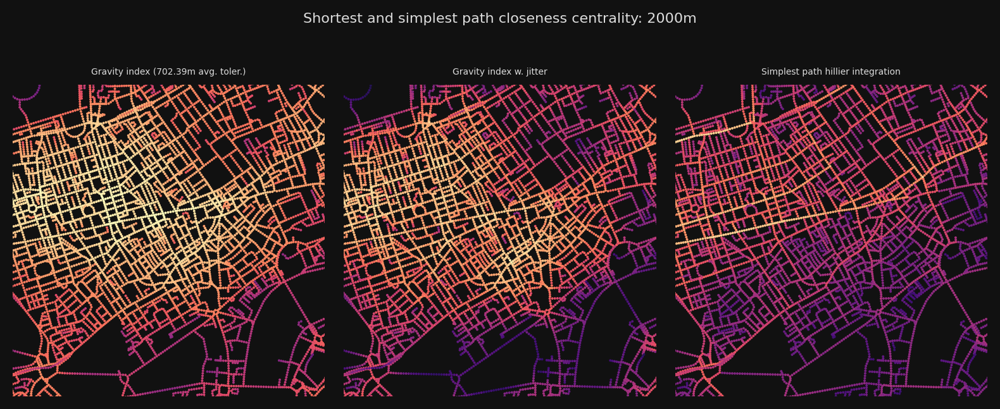

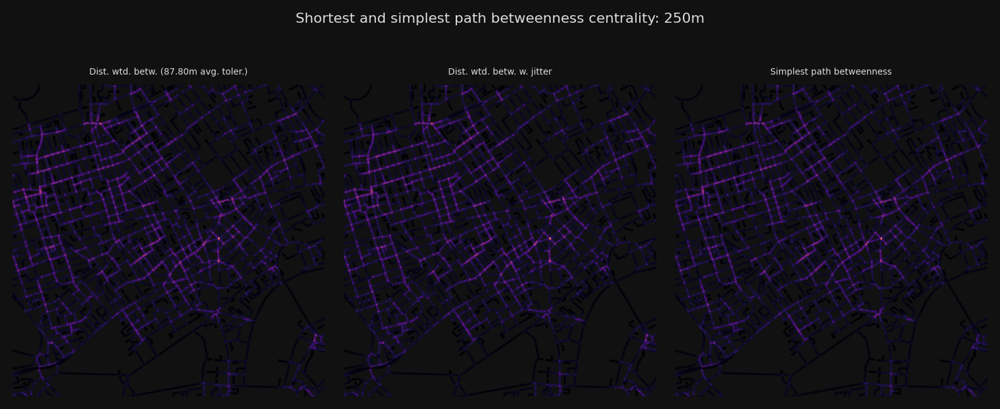

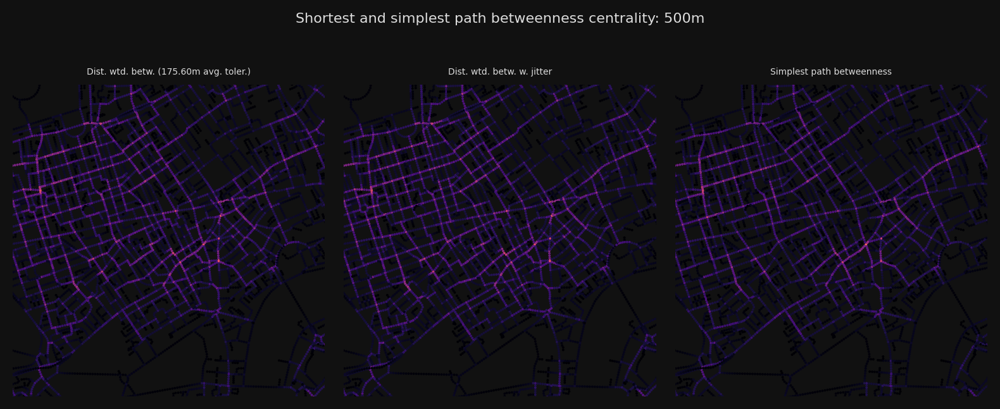

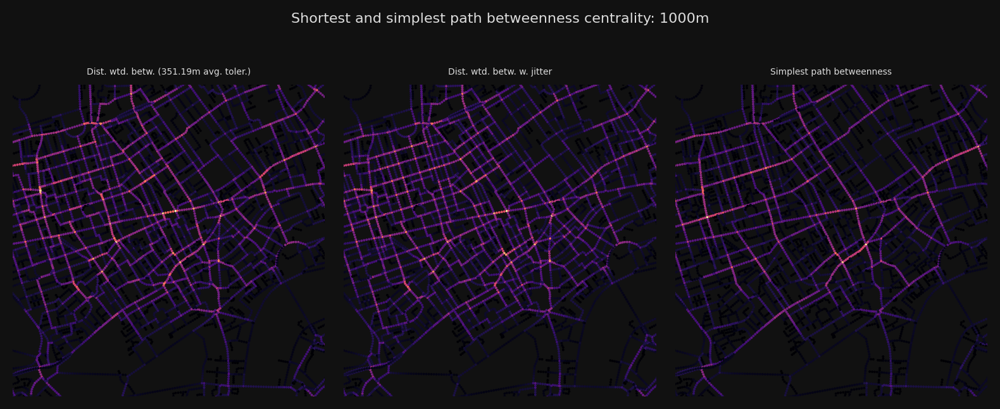

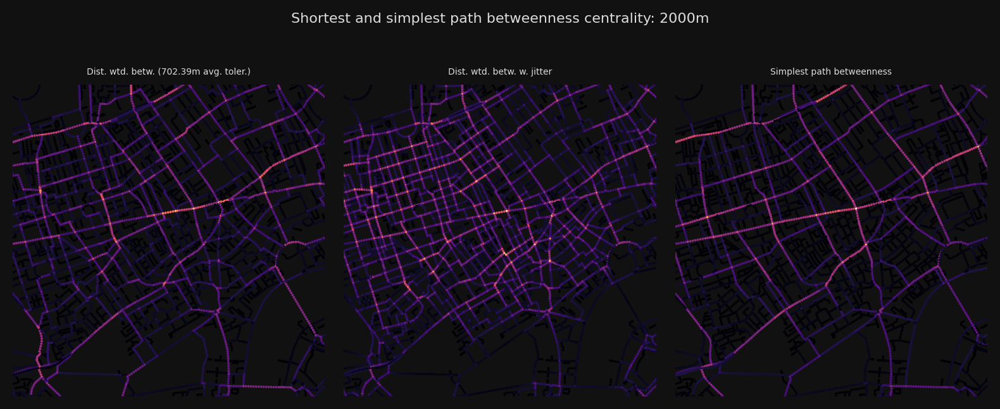

In [9]:
import matplotlib.pyplot as plt
from cityseer import rustalgos
from cityseer.tools import plot

bg_colour = "#111"
betas = rustalgos.betas_from_distances(distances)
avg_dists = rustalgos.avg_distances_for_betas(betas)
bg_colour = "#111"
text_colour = "#ddd"
font_size = 5
for d, b, avg_d in zip(distances, betas, avg_dists):
    fig, axes = plt.subplots(1, 3, figsize=(8, 3.5), dpi=200, facecolor=bg_colour)
    fig.suptitle(
        f"Shortest and simplest path closeness centrality: {d}m",
        fontsize=8,
        color=text_colour,
    )
    nodes_gdf.plot(
        column=f"cc_beta_{d}",
        cmap="magma",
        legend=False,
        ax=axes[0],
        markersize=2,
        edgecolor="none",
    )
    axes[0].set_title(
        f"Gravity index ({avg_d:.2f}m avg. toler.)",
        fontsize=font_size,
        color=text_colour,
    )
    nodes_gdf_jitter.plot(
        column=f"cc_beta_{d}",
        cmap="magma",
        legend=False,
        ax=axes[1],
        markersize=2,
        edgecolor="none",
    )
    axes[1].set_title(f"Gravity index w. jitter", fontsize=font_size, color=text_colour)
    nodes_gdf.plot(
        column=f"cc_hillier_{d}_ang",
        cmap="magma",
        legend=False,
        ax=axes[2],
        markersize=2,
        edgecolor="none",
    )
    axes[2].set_title(
        f"Simplest path hillier integration", fontsize=font_size, color=text_colour
    )
    for ax in axes:
        # set the axis limits
        ax.set_xlim(plot_bbox[0], plot_bbox[2])
        ax.set_ylim(plot_bbox[1], plot_bbox[3])
        # turn off the axis
        ax.axis(False)
    plt.tight_layout()
    plt.show()

for d, b, avg_d in zip(distances, betas, avg_dists):
    fig, axes = plt.subplots(1, 3, figsize=(8, 3.5), dpi=200, facecolor=bg_colour)
    fig.suptitle(
        f"Shortest and simplest path betweenness centrality: {d}m",
        fontsize=8,
        color=text_colour,
    )
    nodes_gdf.plot(
        column=f"cc_betweenness_{d}",
        cmap="magma",
        legend=False,
        ax=axes[0],
        markersize=2,
        edgecolor="none",
    )
    axes[0].set_title(
        f"Dist. wtd. betw. ({avg_d:.2f}m avg. toler.)",
        fontsize=font_size,
        color=text_colour,
    )
    nodes_gdf_jitter.plot(
        column=f"cc_betweenness_{d}",
        cmap="magma",
        legend=False,
        ax=axes[1],
        markersize=2,
        edgecolor="none",
    )
    axes[1].set_title(
        f"Dist. wtd. betw. w. jitter", fontsize=font_size, color=text_colour
    )
    nodes_gdf.plot(
        column=f"cc_betweenness_{d}_ang",
        cmap="magma",
        legend=False,
        ax=axes[2],
        markersize=2,
        edgecolor="none",
    )
    axes[2].set_title(
        f"Simplest path betweenness", fontsize=font_size, color=text_colour
    )
    for ax in axes:
        # set the axis limits
        ax.set_xlim(plot_bbox[0], plot_bbox[2])
        ax.set_ylim(plot_bbox[1], plot_bbox[3])
        # turn off the axis
        ax.axis(False)
    plt.tight_layout()
    plt.show()